In [ ]:
# Write your code here.
import os
import random
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, datasets, utils
from torch.utils.data import DataLoader, Dataset
from PIL import Image
from tqdm import tqdm
import copy
import matplotlib.pyplot as plt


In [ ]:
!wget http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/facades.tar.gz
!tar -xvzf facades.tar.gz

--2025-03-30 16:56:13--  http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/facades.tar.gz
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.244.190
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.244.190|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30168306 (29M) [application/x-gzip]
Saving to: ‘facades.tar.gz’

facades.tar.gz      100%[===================>]  28.77M   862KB/s    in 56s     

2025-03-30 16:57:10 (529 KB/s) - ‘facades.tar.gz’ saved [30168306/30168306]

facades/
facades/test/
facades/test/27.jpg
facades/test/5.jpg
facades/test/72.jpg
facades/test/1.jpg
facades/test/10.jpg
facades/test/100.jpg
facades/test/101.jpg
facades/test/102.jpg
facades/test/103.jpg
facades/test/104.jpg
facades/test/105.jpg
facades/test/106.jpg
facades/test/11.jpg
facades/test/12.jpg
facades/test/13.jpg
facades/test/14.jpg
facades/test/15.jpg
facades/test/16.jpg
facades/test/17.jpg
facades/test/18.jpg
facades/tes

In [ ]:
# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [ ]:
# Custom dataset class
class FacadeDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_files = os.listdir(root_dir)

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.image_files[idx])
        img = Image.open(img_path)
        w, h = img.size
        input_img = img.crop((0, 0, w // 2, h))   # label map
        target_img = img.crop((w // 2, 0, w, h))  # real facade

        if self.transform:
            input_img = self.transform(input_img)
            target_img = self.transform(target_img)

        return input_img, target_img


In [ ]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

train_dataset = FacadeDataset(root_dir="facades/train", transform=transform)
val_dataset   = FacadeDataset(root_dir="facades/val", transform=transform)
test_dataset  = FacadeDataset(root_dir="facades/test", transform=transform)

batch_size = 1 # Mentioned in the research paper
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=1, shuffle=False)
test_loader  = DataLoader(test_dataset, batch_size=1, shuffle=False)

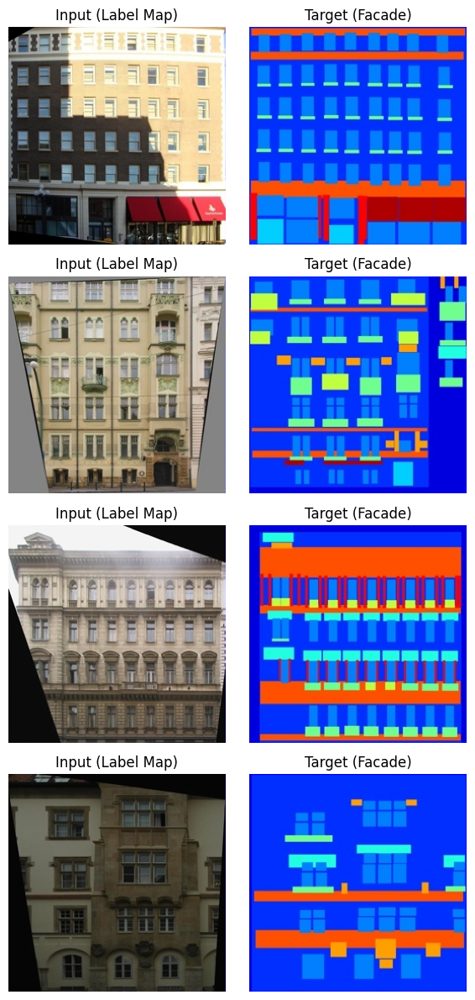

In [ ]:
def show_train_batch(train_loader, num_images=4):
    inputs_list, targets_list = [], []

    for i, (input_img, target_img) in enumerate(train_loader):
        inputs_list.append(input_img)
        targets_list.append(target_img)
        if len(inputs_list) == num_images:
            break

    inputs = torch.cat(inputs_list, dim=0)
    targets = torch.cat(targets_list, dim=0)

    inputs = (inputs + 1) / 2
    targets = (targets + 1) / 2

    fig, axs = plt.subplots(num_images, 2, figsize=(6, 3 * num_images))
    for i in range(num_images):
        axs[i, 0].imshow(inputs[i].permute(1, 2, 0).cpu().numpy())
        axs[i, 0].set_title("Input (Label Map)")
        axs[i, 0].axis('off')

        axs[i, 1].imshow(targets[i].permute(1, 2, 0).cpu().numpy())
        axs[i, 1].set_title("Target (Facade)")
        axs[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

show_train_batch(train_loader)

In [ ]:
# U-Net Generator architecture
class UNetGenerator(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, features=64):
        super().__init__()

        def down_block(in_f, out_f, bn=True):
            layers = [nn.Conv2d(in_f, out_f, 4, 2, 1, bias=False)]
            if bn:
                layers.append(nn.InstanceNorm2d(out_f, affine=True))
            layers.append(nn.LeakyReLU(0.2))
            return nn.Sequential(*layers)

        def up_block(in_f, out_f, dropout=False):
            layers = [
                nn.ConvTranspose2d(in_f, out_f, 4, 2, 1, bias=False),
                nn.InstanceNorm2d(out_f, affine=True),
                nn.ReLU()
            ]
            if dropout:
                layers.append(nn.Dropout(0.5))
            return nn.Sequential(*layers)

        self.downs = nn.ModuleList([
            down_block(in_channels, features, bn=False),
            down_block(features, features * 2),
            down_block(features * 2, features * 4),
            down_block(features * 4, features * 8),
            down_block(features * 8, features * 8),
            down_block(features * 8, features * 8),
            down_block(features * 8, features * 8),
            down_block(features * 8, features * 8, bn=False),
            ])

        self.ups = nn.ModuleList([
            up_block(features * 8, features * 8, dropout=True),
            up_block(features * 16, features * 8, dropout=True),
            up_block(features * 16, features * 8, dropout=True),
            up_block(features * 16, features * 8),
            up_block(features * 16, features * 4),
            up_block(features * 8, features * 2),
            up_block(features * 4, features),
            nn.Sequential(
                nn.ConvTranspose2d(features * 2, out_channels, 4, 2, 1),
                nn.Tanh()
            )
        ])

    def forward(self, x):
        skips = []
        for down in self.downs:
            x = down(x)
            skips.append(x)
        skips = skips[:-1][::-1]
        for i in range(len(self.ups)):
            if i == 0:
                x = self.ups[i](x)
            else:
                x = self.ups[i](torch.cat([x, skips[i - 1]], dim=1))
        return x


In [ ]:
# PatchGAN Classifier architecture
class PatchGANDiscriminator(nn.Module):
    def __init__(self, in_channels=6, features=64):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(in_channels, features, 4, 2, 1),
            nn.LeakyReLU(0.2),

            nn.Conv2d(features, features * 2, 4, 2, 1),
            nn.InstanceNorm2d(features*2, affine=True),
            nn.LeakyReLU(0.2),

            nn.Conv2d(features * 2, features * 4, 4, 2, 1),
            nn.InstanceNorm2d(features*4, affine=True),
            nn.LeakyReLU(0.2),

            nn.Conv2d(features * 4, features * 8, 4, 1, 1),
            nn.InstanceNorm2d(features*8, affine=True),
            nn.LeakyReLU(0.2),

            nn.Conv2d(features * 8, 1, 4, 1, 1),
            nn.Sigmoid()
        )

    def forward(self, x, y):
        return self.model(torch.cat([x, y], dim=1))


In [ ]:
# Initialize Models
gen = UNetGenerator().to(device)
disc = PatchGANDiscriminator().to(device)

# Optimizers
g_opt = optim.Adam(gen.parameters(), lr=2e-4, betas=(0.5, 0.999))
d_opt = optim.Adam(disc.parameters(), lr=2e-4, betas=(0.5, 0.999))

# Loss
bce = nn.BCELoss()
l1 = nn.L1Loss()
λ=100

In [ ]:
def show_generator_outputs(generator, loader, device, num_samples=4):
    generator.eval()
    inputs_list, targets_list, preds_list = [], [], []

    with torch.no_grad():
        for input_img, target_img in loader:
            input_img, target_img = input_img.to(device), target_img.to(device)
            pred_img = generator(input_img)

            inputs_list.append(input_img)
            targets_list.append(target_img)
            preds_list.append(pred_img)

            if len(inputs_list) >= num_samples:
                break

    # Concatenate and unnormalize
    inputs = torch.cat(inputs_list, dim=0)[:num_samples]
    targets = torch.cat(targets_list, dim=0)[:num_samples]
    preds = torch.cat(preds_list, dim=0)[:num_samples]

    inputs = (inputs + 1) / 2
    targets = (targets + 1) / 2
    preds = (preds + 1) / 2

    fig, axs = plt.subplots(num_samples, 3, figsize=(9, 3 * num_samples))
    for i in range(num_samples):
        axs[i, 0].imshow(inputs[i].permute(1, 2, 0).cpu().numpy())
        axs[i, 0].set_title("Input (Label Map)")
        axs[i, 0].axis('off')

        axs[i, 1].imshow(preds[i].permute(1, 2, 0).cpu().numpy())
        axs[i, 1].set_title("Generated (Output)")
        axs[i, 1].axis('off')

        axs[i, 2].imshow(targets[i].permute(1, 2, 0).cpu().numpy())
        axs[i, 2].set_title("Target (Facade)")
        axs[i, 2].axis('off')

    plt.tight_layout()
    plt.show()



In [ ]:
def train_pix2pix(generator, discriminator, train_loader, val_loader, g_opt, d_opt, l1, bce, epochs=100, λ=100):
    g_train_losses, d_train_losses =[], []
    val_losses = []
    min_val_loss = float('inf')

    def generator_loss(d_output, fake, real):
        adv_loss = bce(d_output, torch.ones_like(d_output))
        l1_loss = l1(fake, real)
        return adv_loss + λ * l1_loss

    def discriminator_loss(real_out, fake_out):
        real_loss = bce(real_out, torch.ones_like(real_out))
        fake_loss = bce(fake_out, torch.zeros_like(fake_out))
        return (real_loss + fake_loss) * 0.5

    for epoch in range(epochs):
        generator.train()
        discriminator.train()
        g_train_loss, d_train_loss=0, 0
        tepoch = tqdm(train_loader, desc=f"Epoch [{epoch+1}/{epochs}]: Training")
        for input_img, target_img in tepoch:
            input_img, target_img = input_img.to(device), target_img.to(device)

            # Discriminator step
            fake_img = generator(input_img)
            d_real = discriminator(input_img, target_img)
            d_fake = discriminator(input_img, fake_img.detach())
            d_loss = discriminator_loss(d_real, d_fake)

            d_opt.zero_grad()
            d_loss.backward()
            d_opt.step()

            # Generator step
            fake_img = generator(input_img)
            d_fake = discriminator(input_img, fake_img)
            g_loss = generator_loss(d_fake, fake_img, target_img)

            g_opt.zero_grad()
            g_loss.backward()
            g_opt.step()

            g_train_loss += g_loss.item()
            d_train_loss += d_loss.item()
            tepoch.set_postfix({"Generator Loss":f"{g_loss.item():.4f}", "Discriminator Loss":f"{d_loss.item():.4f}"})

        g_train_loss /= len(train_loader)
        g_train_losses.append(g_train_loss)
        d_train_loss /= len(train_loader)
        d_train_losses.append(d_train_loss)

        print(f"Epoch {epoch+1} - Generator Loss: {g_train_loss:.4f}, Discriminator Loss: {d_train_loss:.4f}")

        # Validation Loss
        generator.eval()
        val_l1_loss = 0
        with torch.no_grad():
            vepoch = tqdm( val_loader, desc=f"Epoch {epoch+1}/{epochs}")
            for val_input, val_target in vepoch:
                val_input, val_target = val_input.to(device), val_target.to(device)
                val_pred = generator(val_input)
                val_l1_loss += l1(val_pred, val_target).item()

                vepoch.set_postfix({"Validation Loss": f"{val_l1_loss}"})
        avg_val_loss = val_l1_loss / len(val_loader)
        val_losses.append(avg_val_loss)

        print(f"Epoch {epoch+1} - Val L1 Loss: {avg_val_loss:.4f}\n")
        if (epoch + 1) % 10 == 0:
            show_generator_outputs(generator, val_loader, device)

        if avg_val_loss < min_val_loss:
            min_val_loss = avg_val_loss
            best_gen = copy.deepcopy(generator)

    return g_train_losses, d_train_losses, val_losses, best_gen


Epoch [1/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.17it/s, Generator Loss=45.8309, Discriminator Loss=0.1827]


Epoch 1 - Generator Loss: 47.2765, Discriminator Loss: 0.2853


Epoch 1/100: 100%|██████████| 100/100 [00:01<00:00, 85.57it/s, Validation Loss=40.359048932790756]


Epoch 1 - Val L1 Loss: 0.4036



Epoch [2/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.27it/s, Generator Loss=35.4286, Discriminator Loss=0.1211]


Epoch 2 - Generator Loss: 41.3654, Discriminator Loss: 0.2734


Epoch 2/100: 100%|██████████| 100/100 [00:01<00:00, 85.12it/s, Validation Loss=39.82663941383362]


Epoch 2 - Val L1 Loss: 0.3983



Epoch [3/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.25it/s, Generator Loss=44.5393, Discriminator Loss=0.1571]


Epoch 3 - Generator Loss: 40.5265, Discriminator Loss: 0.2579


Epoch 3/100: 100%|██████████| 100/100 [00:01<00:00, 74.94it/s, Validation Loss=40.5942395478487]


Epoch 3 - Val L1 Loss: 0.4059



Epoch [4/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.43it/s, Generator Loss=57.5161, Discriminator Loss=0.0260]


Epoch 4 - Generator Loss: 39.7747, Discriminator Loss: 0.2620


Epoch 4/100: 100%|██████████| 100/100 [00:01<00:00, 86.56it/s, Validation Loss=39.153345823287964]


Epoch 4 - Val L1 Loss: 0.3915



Epoch [5/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.32it/s, Generator Loss=31.3729, Discriminator Loss=0.0665]


Epoch 5 - Generator Loss: 39.1733, Discriminator Loss: 0.2476


Epoch 5/100: 100%|██████████| 100/100 [00:01<00:00, 86.69it/s, Validation Loss=38.8546607196331]


Epoch 5 - Val L1 Loss: 0.3885



Epoch [6/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.29it/s, Generator Loss=58.5924, Discriminator Loss=0.0400]


Epoch 6 - Generator Loss: 38.3849, Discriminator Loss: 0.2501


Epoch 6/100: 100%|██████████| 100/100 [00:01<00:00, 86.91it/s, Validation Loss=39.460676699876785]


Epoch 6 - Val L1 Loss: 0.3946



Epoch [7/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.31it/s, Generator Loss=27.6857, Discriminator Loss=0.0888]


Epoch 7 - Generator Loss: 37.9941, Discriminator Loss: 0.2447


Epoch 7/100: 100%|██████████| 100/100 [00:01<00:00, 86.08it/s, Validation Loss=37.58610725402832]


Epoch 7 - Val L1 Loss: 0.3759



Epoch [8/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.29it/s, Generator Loss=31.7636, Discriminator Loss=0.5435]


Epoch 8 - Generator Loss: 36.9133, Discriminator Loss: 0.2202


Epoch 8/100: 100%|██████████| 100/100 [00:01<00:00, 73.97it/s, Validation Loss=38.21075160801411]


Epoch 8 - Val L1 Loss: 0.3821



Epoch [9/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.31it/s, Generator Loss=20.0412, Discriminator Loss=1.2668]


Epoch 9 - Generator Loss: 36.1050, Discriminator Loss: 0.2225


Epoch 9/100: 100%|██████████| 100/100 [00:01<00:00, 86.67it/s, Validation Loss=37.323079600930214]


Epoch 9 - Val L1 Loss: 0.3732



Epoch [10/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.30it/s, Generator Loss=37.7476, Discriminator Loss=0.3369]


Epoch 10 - Generator Loss: 35.3776, Discriminator Loss: 0.2032


Epoch 10/100: 100%|██████████| 100/100 [00:01<00:00, 85.50it/s, Validation Loss=37.87221468985081]


Epoch 10 - Val L1 Loss: 0.3787



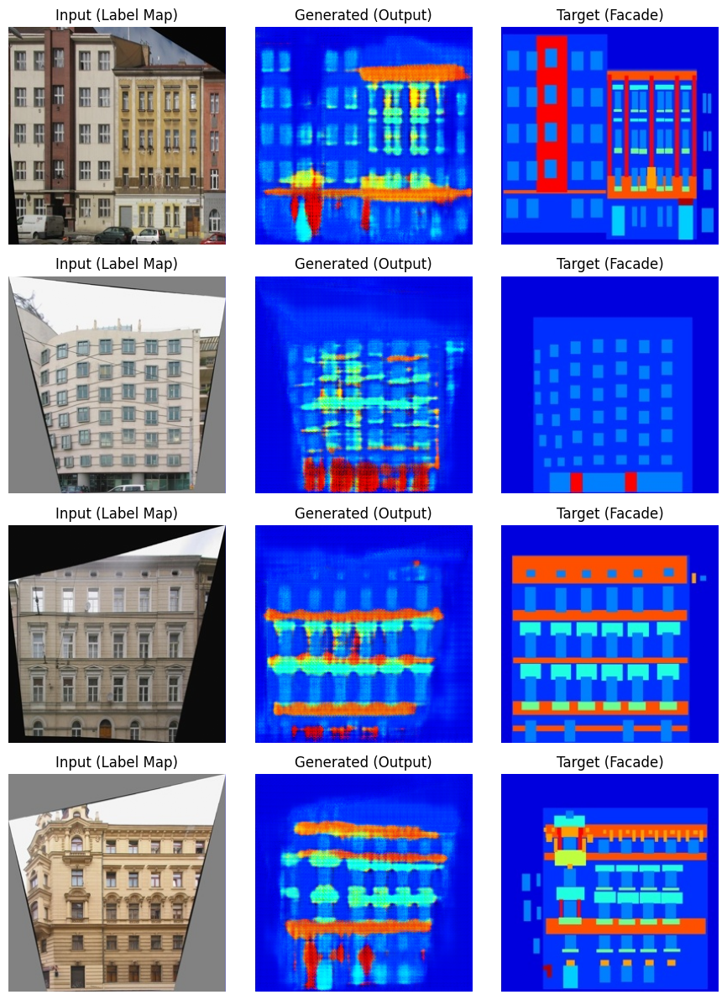

Epoch [11/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.17it/s, Generator Loss=27.2332, Discriminator Loss=0.0574]


Epoch 11 - Generator Loss: 34.7609, Discriminator Loss: 0.1910


Epoch 11/100: 100%|██████████| 100/100 [00:01<00:00, 76.80it/s, Validation Loss=36.81532455980778]


Epoch 11 - Val L1 Loss: 0.3682



Epoch [12/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.16it/s, Generator Loss=38.1913, Discriminator Loss=0.0563]


Epoch 12 - Generator Loss: 33.5336, Discriminator Loss: 0.1772


Epoch 12/100: 100%|██████████| 100/100 [00:01<00:00, 67.80it/s, Validation Loss=37.35911402106285]


Epoch 12 - Val L1 Loss: 0.3736



Epoch [13/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.20it/s, Generator Loss=34.4470, Discriminator Loss=0.0422]


Epoch 13 - Generator Loss: 32.7205, Discriminator Loss: 0.2039


Epoch 13/100: 100%|██████████| 100/100 [00:01<00:00, 75.39it/s, Validation Loss=37.33564056456089]


Epoch 13 - Val L1 Loss: 0.3734



Epoch [14/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.15it/s, Generator Loss=29.7490, Discriminator Loss=0.0167]


Epoch 14 - Generator Loss: 31.9013, Discriminator Loss: 0.1864


Epoch 14/100: 100%|██████████| 100/100 [00:01<00:00, 77.47it/s, Validation Loss=36.53671872615814]


Epoch 14 - Val L1 Loss: 0.3654



Epoch [15/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.20it/s, Generator Loss=54.9171, Discriminator Loss=0.0638]


Epoch 15 - Generator Loss: 31.4225, Discriminator Loss: 0.1557


Epoch 15/100: 100%|██████████| 100/100 [00:01<00:00, 74.38it/s, Validation Loss=36.172929629683495]


Epoch 15 - Val L1 Loss: 0.3617



Epoch [16/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.20it/s, Generator Loss=38.7941, Discriminator Loss=0.0141]


Epoch 16 - Generator Loss: 30.1843, Discriminator Loss: 0.2172


Epoch 16/100: 100%|██████████| 100/100 [00:01<00:00, 78.17it/s, Validation Loss=36.58339834213257]


Epoch 16 - Val L1 Loss: 0.3658



Epoch [17/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.18it/s, Generator Loss=44.6152, Discriminator Loss=0.0851]


Epoch 17 - Generator Loss: 29.8428, Discriminator Loss: 0.1177


Epoch 17/100: 100%|██████████| 100/100 [00:01<00:00, 77.84it/s, Validation Loss=36.49291969835758]


Epoch 17 - Val L1 Loss: 0.3649



Epoch [18/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.18it/s, Generator Loss=52.0256, Discriminator Loss=0.0031]


Epoch 18 - Generator Loss: 29.2839, Discriminator Loss: 0.1553


Epoch 18/100: 100%|██████████| 100/100 [00:01<00:00, 76.35it/s, Validation Loss=36.78887738287449]


Epoch 18 - Val L1 Loss: 0.3679



Epoch [19/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.19it/s, Generator Loss=37.8455, Discriminator Loss=0.0067]


Epoch 19 - Generator Loss: 28.3035, Discriminator Loss: 0.2159


Epoch 19/100: 100%|██████████| 100/100 [00:01<00:00, 77.68it/s, Validation Loss=36.478655591607094]


Epoch 19 - Val L1 Loss: 0.3648



Epoch [20/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.17it/s, Generator Loss=18.8681, Discriminator Loss=0.7682]


Epoch 20 - Generator Loss: 28.4759, Discriminator Loss: 0.0922


Epoch 20/100: 100%|██████████| 100/100 [00:01<00:00, 71.13it/s, Validation Loss=36.51705591380596]


Epoch 20 - Val L1 Loss: 0.3652



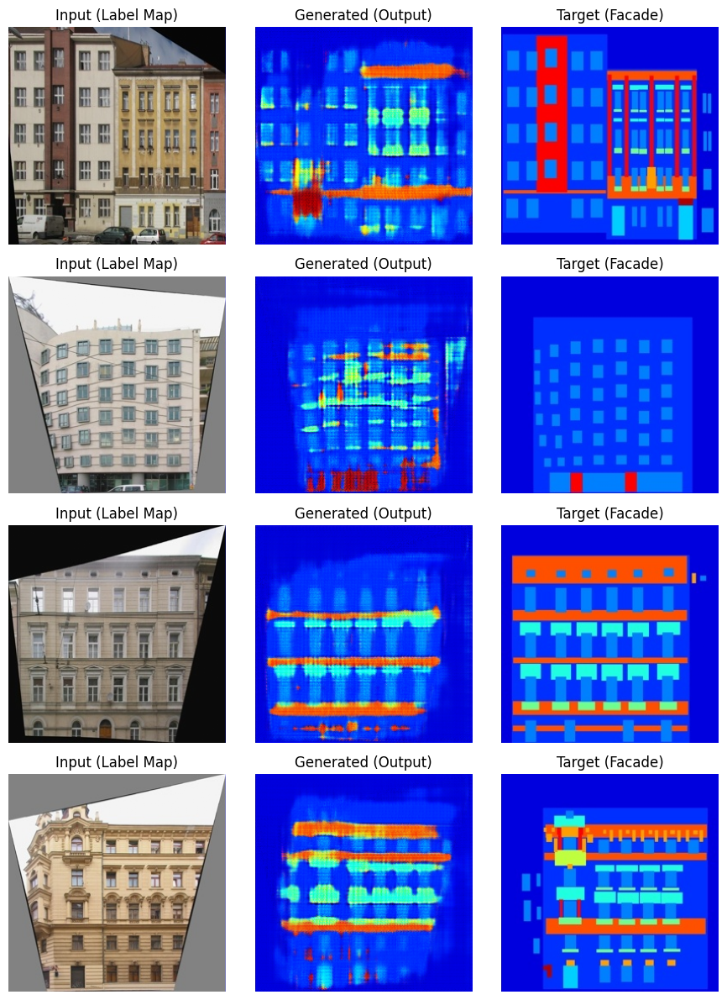

Epoch [21/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.22it/s, Generator Loss=33.6340, Discriminator Loss=0.0171]


Epoch 21 - Generator Loss: 27.6638, Discriminator Loss: 0.1396


Epoch 21/100: 100%|██████████| 100/100 [00:01<00:00, 78.27it/s, Validation Loss=36.11649540066719]


Epoch 21 - Val L1 Loss: 0.3612



Epoch [22/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.14it/s, Generator Loss=25.6865, Discriminator Loss=0.0313]


Epoch 22 - Generator Loss: 27.4715, Discriminator Loss: 0.1573


Epoch 22/100: 100%|██████████| 100/100 [00:01<00:00, 76.21it/s, Validation Loss=35.69675815105438]


Epoch 22 - Val L1 Loss: 0.3570



Epoch [23/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.17it/s, Generator Loss=17.3672, Discriminator Loss=0.0278]


Epoch 23 - Generator Loss: 26.3390, Discriminator Loss: 0.1522


Epoch 23/100: 100%|██████████| 100/100 [00:01<00:00, 76.79it/s, Validation Loss=35.75643688440323]


Epoch 23 - Val L1 Loss: 0.3576



Epoch [24/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.15it/s, Generator Loss=44.8993, Discriminator Loss=0.0086]


Epoch 24 - Generator Loss: 26.3985, Discriminator Loss: 0.1959


Epoch 24/100: 100%|██████████| 100/100 [00:01<00:00, 77.56it/s, Validation Loss=35.80430418252945]


Epoch 24 - Val L1 Loss: 0.3580



Epoch [25/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.20it/s, Generator Loss=43.5809, Discriminator Loss=0.0021]


Epoch 25 - Generator Loss: 25.2777, Discriminator Loss: 0.1057


Epoch 25/100: 100%|██████████| 100/100 [00:01<00:00, 77.32it/s, Validation Loss=36.155056178569794]


Epoch 25 - Val L1 Loss: 0.3616



Epoch [26/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.15it/s, Generator Loss=20.0769, Discriminator Loss=0.0272]


Epoch 26 - Generator Loss: 28.6562, Discriminator Loss: 0.0175


Epoch 26/100: 100%|██████████| 100/100 [00:01<00:00, 81.86it/s, Validation Loss=36.05968897044659]


Epoch 26 - Val L1 Loss: 0.3606



Epoch [27/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.22it/s, Generator Loss=20.4049, Discriminator Loss=0.7223]


Epoch 27 - Generator Loss: 24.5778, Discriminator Loss: 0.2483


Epoch 27/100: 100%|██████████| 100/100 [00:01<00:00, 79.87it/s, Validation Loss=36.139687582850456]


Epoch 27 - Val L1 Loss: 0.3614



Epoch [28/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.10it/s, Generator Loss=34.1527, Discriminator Loss=0.0854]


Epoch 28 - Generator Loss: 23.3596, Discriminator Loss: 0.1971


Epoch 28/100: 100%|██████████| 100/100 [00:01<00:00, 75.80it/s, Validation Loss=35.79530857503414]


Epoch 28 - Val L1 Loss: 0.3580



Epoch [29/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.10it/s, Generator Loss=22.2195, Discriminator Loss=0.0052]


Epoch 29 - Generator Loss: 25.4381, Discriminator Loss: 0.0240


Epoch 29/100: 100%|██████████| 100/100 [00:01<00:00, 71.49it/s, Validation Loss=36.093128085136414]


Epoch 29 - Val L1 Loss: 0.3609



Epoch [30/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.10it/s, Generator Loss=24.7703, Discriminator Loss=0.0176]


Epoch 30 - Generator Loss: 23.5450, Discriminator Loss: 0.2119


Epoch 30/100: 100%|██████████| 100/100 [00:01<00:00, 78.11it/s, Validation Loss=35.462951213121414]


Epoch 30 - Val L1 Loss: 0.3546



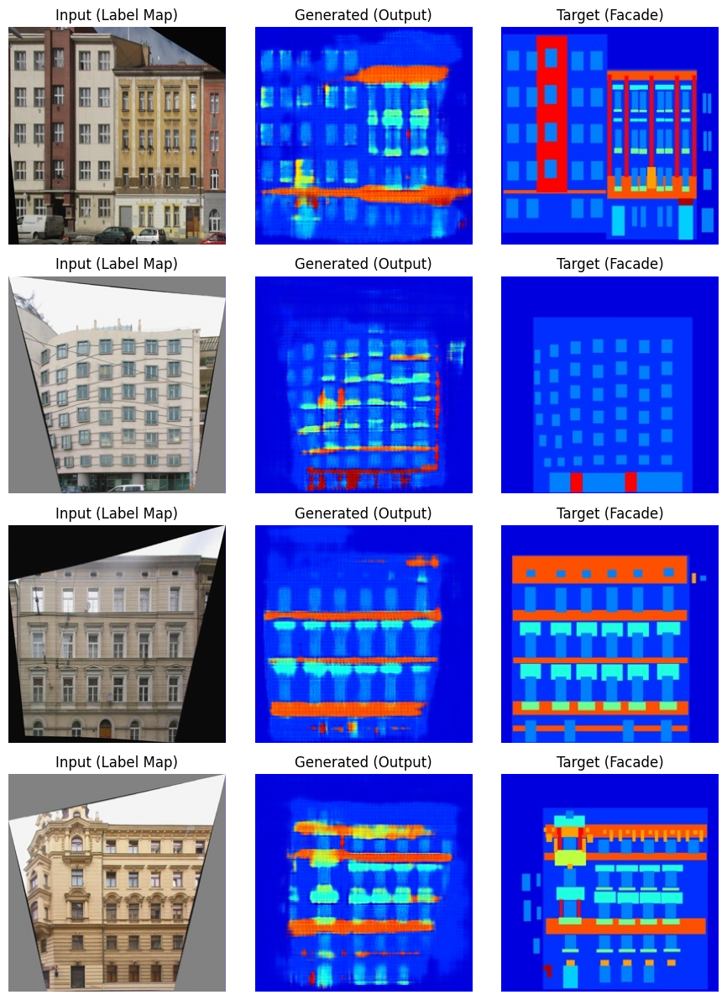

Epoch [31/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.16it/s, Generator Loss=38.0072, Discriminator Loss=0.0038]


Epoch 31 - Generator Loss: 24.2493, Discriminator Loss: 0.0993


Epoch 31/100: 100%|██████████| 100/100 [00:01<00:00, 73.29it/s, Validation Loss=35.817486330866814]


Epoch 31 - Val L1 Loss: 0.3582



Epoch [32/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.12it/s, Generator Loss=42.3393, Discriminator Loss=0.0011]


Epoch 32 - Generator Loss: 22.8966, Discriminator Loss: 0.1199


Epoch 32/100: 100%|██████████| 100/100 [00:01<00:00, 80.25it/s, Validation Loss=35.93178750574589]


Epoch 32 - Val L1 Loss: 0.3593



Epoch [33/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.16it/s, Generator Loss=18.7545, Discriminator Loss=0.8226]


Epoch 33 - Generator Loss: 23.3857, Discriminator Loss: 0.1706


Epoch 33/100: 100%|██████████| 100/100 [00:01<00:00, 78.23it/s, Validation Loss=35.465496346354485]


Epoch 33 - Val L1 Loss: 0.3547



Epoch [34/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.15it/s, Generator Loss=27.8797, Discriminator Loss=0.0013]


Epoch 34 - Generator Loss: 21.3865, Discriminator Loss: 0.1767


Epoch 34/100: 100%|██████████| 100/100 [00:01<00:00, 78.94it/s, Validation Loss=35.45173980295658]


Epoch 34 - Val L1 Loss: 0.3545



Epoch [35/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.15it/s, Generator Loss=17.1818, Discriminator Loss=0.0199]


Epoch 35 - Generator Loss: 23.6648, Discriminator Loss: 0.0121


Epoch 35/100: 100%|██████████| 100/100 [00:01<00:00, 74.81it/s, Validation Loss=34.87598580121994]


Epoch 35 - Val L1 Loss: 0.3488



Epoch [36/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.18it/s, Generator Loss=19.4725, Discriminator Loss=0.0396]


Epoch 36 - Generator Loss: 23.7770, Discriminator Loss: 0.1182


Epoch 36/100: 100%|██████████| 100/100 [00:01<00:00, 78.79it/s, Validation Loss=35.5325903147459]


Epoch 36 - Val L1 Loss: 0.3553



Epoch [37/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.17it/s, Generator Loss=16.7820, Discriminator Loss=0.2192]


Epoch 37 - Generator Loss: 20.5842, Discriminator Loss: 0.2227


Epoch 37/100: 100%|██████████| 100/100 [00:01<00:00, 73.77it/s, Validation Loss=34.960426330566406]


Epoch 37 - Val L1 Loss: 0.3496



Epoch [38/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.16it/s, Generator Loss=24.0678, Discriminator Loss=0.0027]


Epoch 38 - Generator Loss: 20.4605, Discriminator Loss: 0.1695


Epoch 38/100: 100%|██████████| 100/100 [00:01<00:00, 76.84it/s, Validation Loss=35.473815590143204]


Epoch 38 - Val L1 Loss: 0.3547



Epoch [39/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.17it/s, Generator Loss=23.0890, Discriminator Loss=0.0017]


Epoch 39 - Generator Loss: 22.6343, Discriminator Loss: 0.0091


Epoch 39/100: 100%|██████████| 100/100 [00:01<00:00, 70.74it/s, Validation Loss=35.484902173280716]


Epoch 39 - Val L1 Loss: 0.3548



Epoch [40/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 11.80it/s, Generator Loss=23.2735, Discriminator Loss=0.9648]


Epoch 40 - Generator Loss: 22.3484, Discriminator Loss: 0.1382


Epoch 40/100: 100%|██████████| 100/100 [00:01<00:00, 78.96it/s, Validation Loss=35.2897706925869]


Epoch 40 - Val L1 Loss: 0.3529



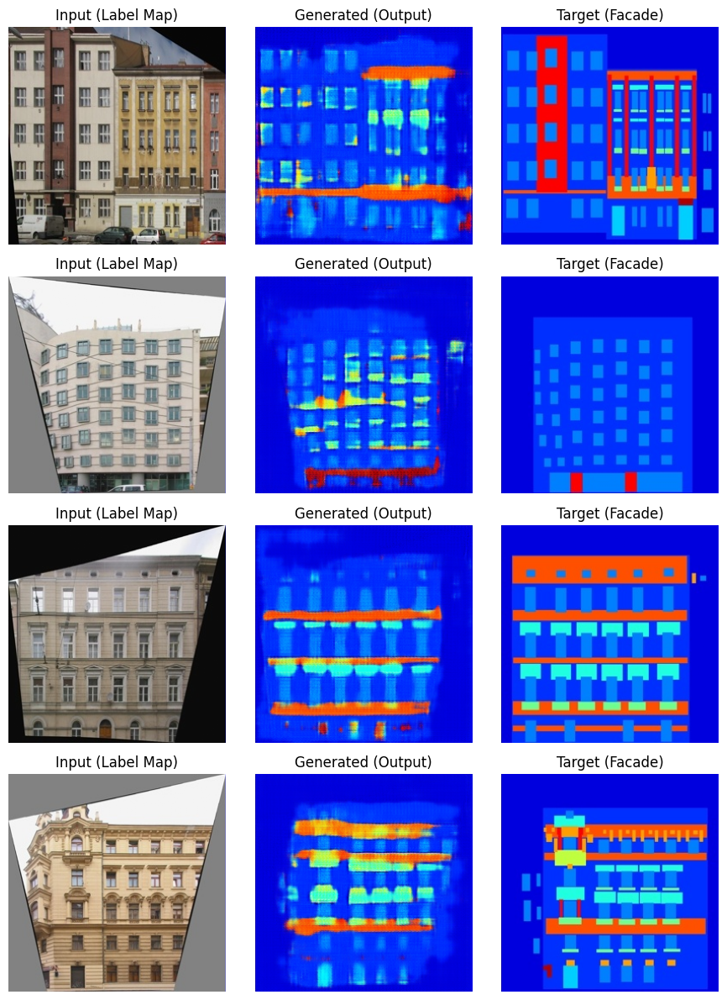

Epoch [41/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.14it/s, Generator Loss=13.1083, Discriminator Loss=0.0203]


Epoch 41 - Generator Loss: 19.9014, Discriminator Loss: 0.1908


Epoch 41/100: 100%|██████████| 100/100 [00:01<00:00, 75.16it/s, Validation Loss=35.635476261377335]


Epoch 41 - Val L1 Loss: 0.3564



Epoch [42/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.10it/s, Generator Loss=28.3134, Discriminator Loss=0.0003]


Epoch 42 - Generator Loss: 22.0899, Discriminator Loss: 0.0111


Epoch 42/100: 100%|██████████| 100/100 [00:01<00:00, 78.40it/s, Validation Loss=35.21326991915703]


Epoch 42 - Val L1 Loss: 0.3521



Epoch [43/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.21it/s, Generator Loss=13.9805, Discriminator Loss=0.1691]


Epoch 43 - Generator Loss: 21.2247, Discriminator Loss: 0.2061


Epoch 43/100: 100%|██████████| 100/100 [00:01<00:00, 74.29it/s, Validation Loss=34.993607416749]


Epoch 43 - Val L1 Loss: 0.3499



Epoch [44/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.20it/s, Generator Loss=30.6661, Discriminator Loss=0.0326]


Epoch 44 - Generator Loss: 18.8090, Discriminator Loss: 0.2106


Epoch 44/100: 100%|██████████| 100/100 [00:01<00:00, 78.49it/s, Validation Loss=34.88815079629421]


Epoch 44 - Val L1 Loss: 0.3489



Epoch [45/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.17it/s, Generator Loss=23.8518, Discriminator Loss=0.0024]


Epoch 45 - Generator Loss: 19.7733, Discriminator Loss: 0.1161


Epoch 45/100: 100%|██████████| 100/100 [00:01<00:00, 70.64it/s, Validation Loss=34.80039092898369]


Epoch 45 - Val L1 Loss: 0.3480



Epoch [46/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.19it/s, Generator Loss=34.8134, Discriminator Loss=0.0062]


Epoch 46 - Generator Loss: 20.6316, Discriminator Loss: 0.0509


Epoch 46/100: 100%|██████████| 100/100 [00:01<00:00, 78.40it/s, Validation Loss=35.546622201800346]


Epoch 46 - Val L1 Loss: 0.3555



Epoch [47/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.11it/s, Generator Loss=24.2129, Discriminator Loss=0.0014]


Epoch 47 - Generator Loss: 22.1281, Discriminator Loss: 0.0044


Epoch 47/100: 100%|██████████| 100/100 [00:01<00:00, 76.76it/s, Validation Loss=35.2868455350399]


Epoch 47 - Val L1 Loss: 0.3529



Epoch [48/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.15it/s, Generator Loss=12.4832, Discriminator Loss=0.1249]


Epoch 48 - Generator Loss: 20.2911, Discriminator Loss: 0.2071


Epoch 48/100: 100%|██████████| 100/100 [00:01<00:00, 78.34it/s, Validation Loss=34.9508870691061]


Epoch 48 - Val L1 Loss: 0.3495



Epoch [49/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.15it/s, Generator Loss=20.8634, Discriminator Loss=0.8870]


Epoch 49 - Generator Loss: 18.6388, Discriminator Loss: 0.1676


Epoch 49/100: 100%|██████████| 100/100 [00:01<00:00, 71.09it/s, Validation Loss=34.95846466720104]


Epoch 49 - Val L1 Loss: 0.3496



Epoch [50/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.10it/s, Generator Loss=36.4571, Discriminator Loss=0.5639]


Epoch 50 - Generator Loss: 19.3955, Discriminator Loss: 0.0854


Epoch 50/100: 100%|██████████| 100/100 [00:01<00:00, 75.52it/s, Validation Loss=35.327111050486565]


Epoch 50 - Val L1 Loss: 0.3533



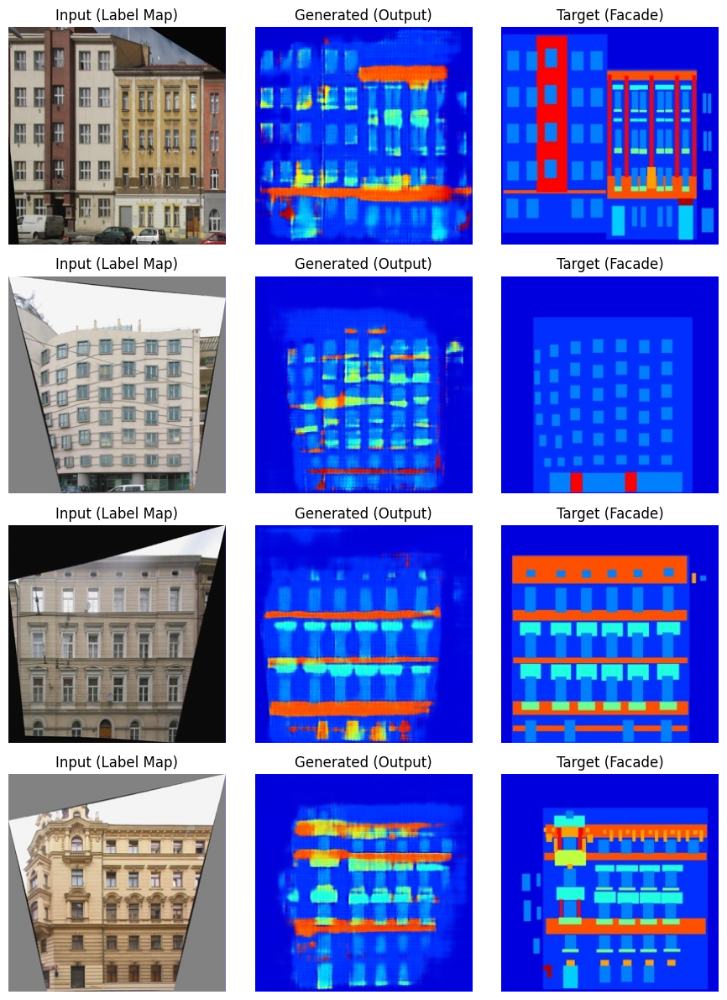

Epoch [51/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.04it/s, Generator Loss=20.7318, Discriminator Loss=0.0020]


Epoch 51 - Generator Loss: 20.8436, Discriminator Loss: 0.0252


Epoch 51/100: 100%|██████████| 100/100 [00:01<00:00, 72.28it/s, Validation Loss=35.09924188256264]


Epoch 51 - Val L1 Loss: 0.3510



Epoch [52/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.12it/s, Generator Loss=17.0115, Discriminator Loss=0.0021]


Epoch 52 - Generator Loss: 21.8673, Discriminator Loss: 0.0043


Epoch 52/100: 100%|██████████| 100/100 [00:01<00:00, 78.86it/s, Validation Loss=35.3630258589983]


Epoch 52 - Val L1 Loss: 0.3536



Epoch [53/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.10it/s, Generator Loss=16.4394, Discriminator Loss=0.8104]


Epoch 53 - Generator Loss: 18.8133, Discriminator Loss: 0.2746


Epoch 53/100: 100%|██████████| 100/100 [00:01<00:00, 77.41it/s, Validation Loss=35.220837622880936]


Epoch 53 - Val L1 Loss: 0.3522



Epoch [54/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.09it/s, Generator Loss=18.2967, Discriminator Loss=0.5948]


Epoch 54 - Generator Loss: 18.7004, Discriminator Loss: 0.1190


Epoch 54/100: 100%|██████████| 100/100 [00:01<00:00, 74.17it/s, Validation Loss=34.8454375565052]


Epoch 54 - Val L1 Loss: 0.3485



Epoch [55/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.06it/s, Generator Loss=19.8528, Discriminator Loss=0.0247]


Epoch 55 - Generator Loss: 17.6295, Discriminator Loss: 0.2303


Epoch 55/100: 100%|██████████| 100/100 [00:01<00:00, 75.85it/s, Validation Loss=34.78233137726784]


Epoch 55 - Val L1 Loss: 0.3478



Epoch [56/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.09it/s, Generator Loss=20.3600, Discriminator Loss=0.0019]


Epoch 56 - Generator Loss: 19.4412, Discriminator Loss: 0.0216


Epoch 56/100: 100%|██████████| 100/100 [00:01<00:00, 77.82it/s, Validation Loss=35.02745412290096]


Epoch 56 - Val L1 Loss: 0.3503



Epoch [57/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.10it/s, Generator Loss=16.4953, Discriminator Loss=0.4229]


Epoch 57 - Generator Loss: 20.0430, Discriminator Loss: 0.1062


Epoch 57/100: 100%|██████████| 100/100 [00:01<00:00, 77.62it/s, Validation Loss=35.040390864014626]


Epoch 57 - Val L1 Loss: 0.3504



Epoch [58/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.12it/s, Generator Loss=22.0602, Discriminator Loss=0.0611]


Epoch 58 - Generator Loss: 17.8337, Discriminator Loss: 0.1573


Epoch 58/100: 100%|██████████| 100/100 [00:01<00:00, 78.57it/s, Validation Loss=35.246587201952934]


Epoch 58 - Val L1 Loss: 0.3525



Epoch [59/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.09it/s, Generator Loss=19.4918, Discriminator Loss=0.0100]


Epoch 59 - Generator Loss: 18.7253, Discriminator Loss: 0.1005


Epoch 59/100: 100%|██████████| 100/100 [00:01<00:00, 76.71it/s, Validation Loss=34.99513828754425]


Epoch 59 - Val L1 Loss: 0.3500



Epoch [60/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.14it/s, Generator Loss=21.3434, Discriminator Loss=0.0008]


Epoch 60 - Generator Loss: 20.5866, Discriminator Loss: 0.0075


Epoch 60/100: 100%|██████████| 100/100 [00:01<00:00, 77.60it/s, Validation Loss=35.316657081246376]


Epoch 60 - Val L1 Loss: 0.3532



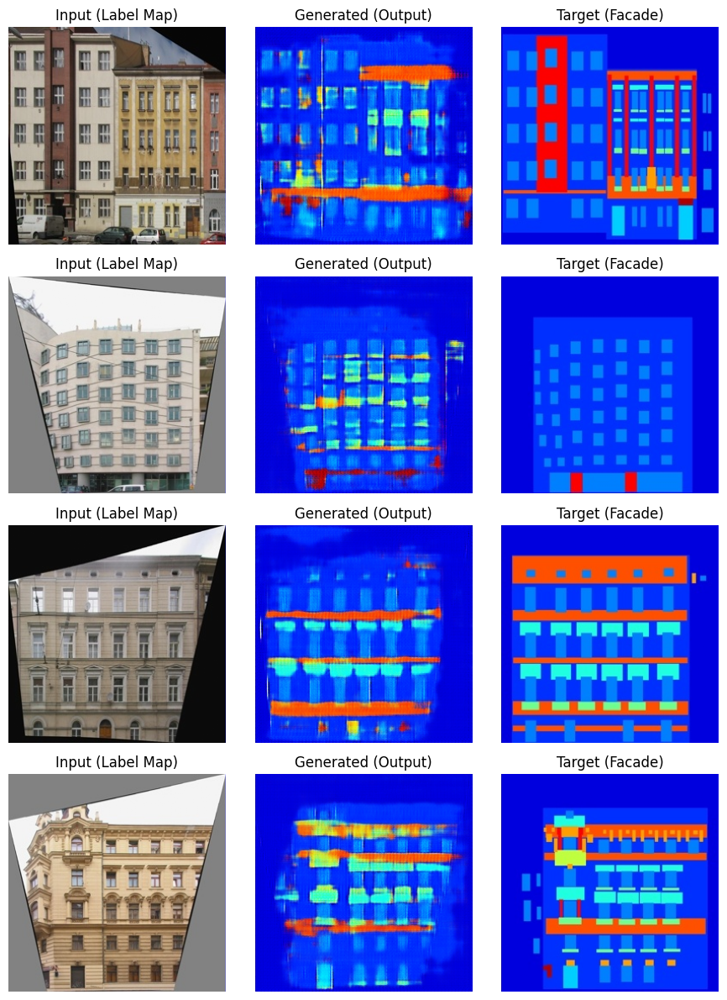

Epoch [61/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.07it/s, Generator Loss=23.1589, Discriminator Loss=0.0078]


Epoch 61 - Generator Loss: 21.4421, Discriminator Loss: 0.0049


Epoch 61/100: 100%|██████████| 100/100 [00:01<00:00, 77.60it/s, Validation Loss=35.40944059193134]


Epoch 61 - Val L1 Loss: 0.3541



Epoch [62/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.09it/s, Generator Loss=21.7738, Discriminator Loss=0.0016]


Epoch 62 - Generator Loss: 21.8915, Discriminator Loss: 0.0044


Epoch 62/100: 100%|██████████| 100/100 [00:01<00:00, 73.40it/s, Validation Loss=34.93023709952831]


Epoch 62 - Val L1 Loss: 0.3493



Epoch [63/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.11it/s, Generator Loss=13.1672, Discriminator Loss=0.6759]


Epoch 63 - Generator Loss: 17.5344, Discriminator Loss: 0.3565


Epoch 63/100: 100%|██████████| 100/100 [00:01<00:00, 78.55it/s, Validation Loss=34.834275990724564]


Epoch 63 - Val L1 Loss: 0.3483



Epoch [64/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.12it/s, Generator Loss=13.1734, Discriminator Loss=0.0092]


Epoch 64 - Generator Loss: 16.1960, Discriminator Loss: 0.2314


Epoch 64/100: 100%|██████████| 100/100 [00:01<00:00, 71.89it/s, Validation Loss=34.74968013167381]


Epoch 64 - Val L1 Loss: 0.3475



Epoch [65/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.16it/s, Generator Loss=17.4527, Discriminator Loss=0.0435]


Epoch 65 - Generator Loss: 16.8231, Discriminator Loss: 0.1900


Epoch 65/100: 100%|██████████| 100/100 [00:01<00:00, 76.81it/s, Validation Loss=34.844449400901794]


Epoch 65 - Val L1 Loss: 0.3484



Epoch [66/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.10it/s, Generator Loss=24.5826, Discriminator Loss=0.0004]


Epoch 66 - Generator Loss: 18.5084, Discriminator Loss: 0.0469


Epoch 66/100: 100%|██████████| 100/100 [00:01<00:00, 68.71it/s, Validation Loss=35.037694215774536]


Epoch 66 - Val L1 Loss: 0.3504



Epoch [67/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.13it/s, Generator Loss=21.7429, Discriminator Loss=0.1016]


Epoch 67 - Generator Loss: 18.7768, Discriminator Loss: 0.1162


Epoch 67/100: 100%|██████████| 100/100 [00:01<00:00, 77.88it/s, Validation Loss=35.0505660623312]


Epoch 67 - Val L1 Loss: 0.3505



Epoch [68/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.18it/s, Generator Loss=22.0505, Discriminator Loss=0.0009]


Epoch 68 - Generator Loss: 17.6462, Discriminator Loss: 0.1219


Epoch 68/100: 100%|██████████| 100/100 [00:01<00:00, 71.04it/s, Validation Loss=35.16568586230278]


Epoch 68 - Val L1 Loss: 0.3517



Epoch [69/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.16it/s, Generator Loss=22.9695, Discriminator Loss=0.0009]


Epoch 69 - Generator Loss: 19.5785, Discriminator Loss: 0.0071


Epoch 69/100: 100%|██████████| 100/100 [00:01<00:00, 79.17it/s, Validation Loss=34.99256172776222]


Epoch 69 - Val L1 Loss: 0.3499



Epoch [70/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.14it/s, Generator Loss=11.7014, Discriminator Loss=0.0450]


Epoch 70 - Generator Loss: 17.7778, Discriminator Loss: 0.1678


Epoch 70/100: 100%|██████████| 100/100 [00:01<00:00, 68.68it/s, Validation Loss=34.766488537192345]


Epoch 70 - Val L1 Loss: 0.3477



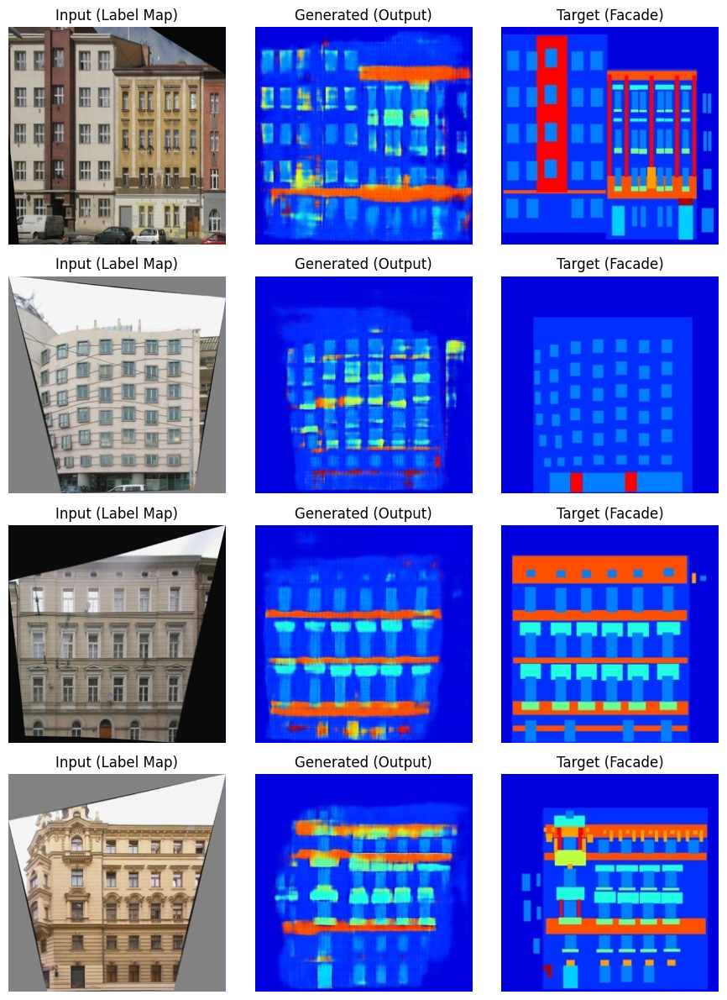

Epoch [71/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.19it/s, Generator Loss=14.1613, Discriminator Loss=0.0107]


Epoch 71 - Generator Loss: 17.5938, Discriminator Loss: 0.1389


Epoch 71/100: 100%|██████████| 100/100 [00:01<00:00, 77.46it/s, Validation Loss=34.7184693813324]


Epoch 71 - Val L1 Loss: 0.3472



Epoch [72/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.09it/s, Generator Loss=18.3986, Discriminator Loss=0.1652]


Epoch 72 - Generator Loss: 19.0549, Discriminator Loss: 0.0446


Epoch 72/100: 100%|██████████| 100/100 [00:01<00:00, 64.54it/s, Validation Loss=34.69616858661175]


Epoch 72 - Val L1 Loss: 0.3470



Epoch [73/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.16it/s, Generator Loss=31.5046, Discriminator Loss=0.0006]


Epoch 73 - Generator Loss: 17.8939, Discriminator Loss: 0.0779


Epoch 73/100: 100%|██████████| 100/100 [00:01<00:00, 78.66it/s, Validation Loss=34.79786656796932]


Epoch 73 - Val L1 Loss: 0.3480



Epoch [74/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.15it/s, Generator Loss=16.5101, Discriminator Loss=0.0037]


Epoch 74 - Generator Loss: 17.6206, Discriminator Loss: 0.1587


Epoch 74/100: 100%|██████████| 100/100 [00:01<00:00, 67.53it/s, Validation Loss=34.807276114821434]


Epoch 74 - Val L1 Loss: 0.3481



Epoch [75/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.10it/s, Generator Loss=20.0194, Discriminator Loss=0.0035]


Epoch 75 - Generator Loss: 17.5877, Discriminator Loss: 0.0962


Epoch 75/100: 100%|██████████| 100/100 [00:01<00:00, 79.35it/s, Validation Loss=34.89052923023701]


Epoch 75 - Val L1 Loss: 0.3489



Epoch [76/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.16it/s, Generator Loss=24.9824, Discriminator Loss=0.0024]


Epoch 76 - Generator Loss: 17.7874, Discriminator Loss: 0.1060


Epoch 76/100: 100%|██████████| 100/100 [00:01<00:00, 78.22it/s, Validation Loss=34.98119008541107]


Epoch 76 - Val L1 Loss: 0.3498



Epoch [77/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.18it/s, Generator Loss=27.5165, Discriminator Loss=0.1337]


Epoch 77 - Generator Loss: 17.7699, Discriminator Loss: 0.1349


Epoch 77/100: 100%|██████████| 100/100 [00:01<00:00, 75.04it/s, Validation Loss=34.829343408346176]


Epoch 77 - Val L1 Loss: 0.3483



Epoch [78/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.10it/s, Generator Loss=15.6306, Discriminator Loss=0.0173]


Epoch 78 - Generator Loss: 18.1430, Discriminator Loss: 0.0608


Epoch 78/100: 100%|██████████| 100/100 [00:01<00:00, 77.94it/s, Validation Loss=34.956325963139534]


Epoch 78 - Val L1 Loss: 0.3496



Epoch [79/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.12it/s, Generator Loss=13.8820, Discriminator Loss=0.0025]


Epoch 79 - Generator Loss: 18.6012, Discriminator Loss: 0.0530


Epoch 79/100: 100%|██████████| 100/100 [00:01<00:00, 77.92it/s, Validation Loss=35.03664639592171]


Epoch 79 - Val L1 Loss: 0.3504



Epoch [80/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.14it/s, Generator Loss=34.3445, Discriminator Loss=0.0021]


Epoch 80 - Generator Loss: 19.8633, Discriminator Loss: 0.0041


Epoch 80/100: 100%|██████████| 100/100 [00:01<00:00, 76.80it/s, Validation Loss=34.79170508682728]


Epoch 80 - Val L1 Loss: 0.3479



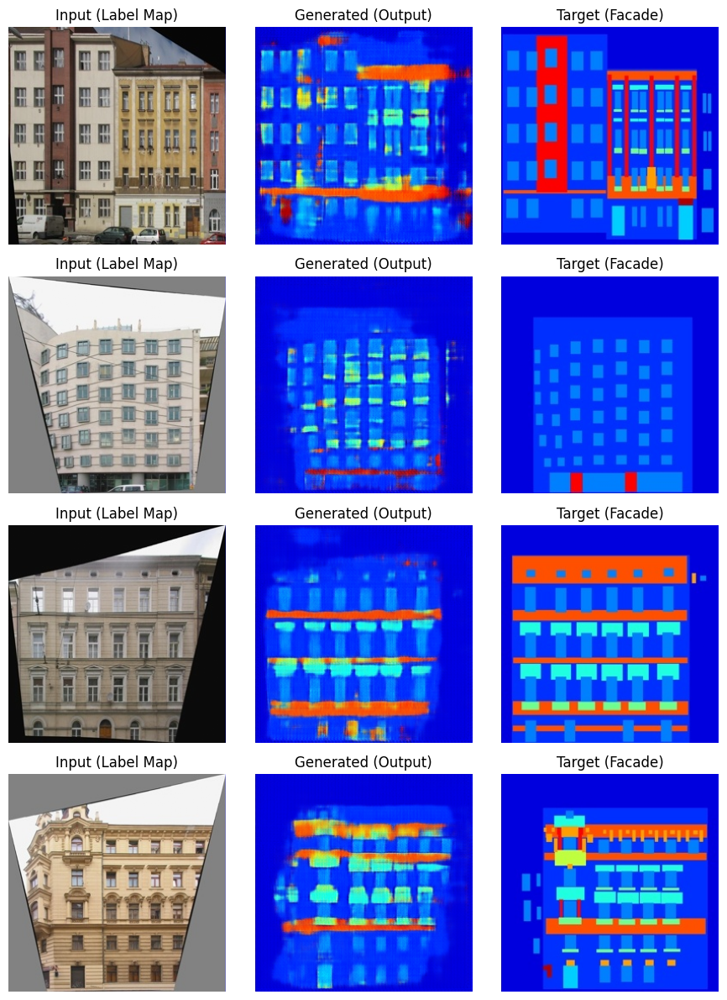

Epoch [81/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.14it/s, Generator Loss=21.0539, Discriminator Loss=0.0003]


Epoch 81 - Generator Loss: 20.3586, Discriminator Loss: 0.0029


Epoch 81/100: 100%|██████████| 100/100 [00:01<00:00, 77.06it/s, Validation Loss=34.92166315019131]


Epoch 81 - Val L1 Loss: 0.3492



Epoch [82/100]: Training: 100%|██████████| 400/400 [00:33<00:00, 12.09it/s, Generator Loss=11.8270, Discriminator Loss=0.6059]


Epoch 82 - Generator Loss: 19.3585, Discriminator Loss: 0.1884


Epoch 82/100: 100%|██████████| 100/100 [00:01<00:00, 75.51it/s, Validation Loss=34.90764872729778]


Epoch 82 - Val L1 Loss: 0.3491



Epoch [83/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.16it/s, Generator Loss=29.9211, Discriminator Loss=0.0170]


Epoch 83 - Generator Loss: 14.6679, Discriminator Loss: 0.3396


Epoch 83/100: 100%|██████████| 100/100 [00:01<00:00, 78.11it/s, Validation Loss=34.5801869481802]


Epoch 83 - Val L1 Loss: 0.3458



Epoch [84/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.14it/s, Generator Loss=13.1126, Discriminator Loss=0.0897]


Epoch 84 - Generator Loss: 15.1420, Discriminator Loss: 0.1991


Epoch 84/100: 100%|██████████| 100/100 [00:01<00:00, 79.76it/s, Validation Loss=34.63726018369198]


Epoch 84 - Val L1 Loss: 0.3464



Epoch [85/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.13it/s, Generator Loss=21.3641, Discriminator Loss=0.0191]


Epoch 85 - Generator Loss: 15.8500, Discriminator Loss: 0.1547


Epoch 85/100: 100%|██████████| 100/100 [00:01<00:00, 79.18it/s, Validation Loss=34.857463628053665]


Epoch 85 - Val L1 Loss: 0.3486



Epoch [86/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.17it/s, Generator Loss=24.1746, Discriminator Loss=0.0007]


Epoch 86 - Generator Loss: 18.1498, Discriminator Loss: 0.0070


Epoch 86/100: 100%|██████████| 100/100 [00:01<00:00, 74.83it/s, Validation Loss=34.750723376870155]


Epoch 86 - Val L1 Loss: 0.3475



Epoch [87/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.18it/s, Generator Loss=15.3880, Discriminator Loss=0.2857]


Epoch 87 - Generator Loss: 18.7365, Discriminator Loss: 0.0508


Epoch 87/100: 100%|██████████| 100/100 [00:01<00:00, 76.60it/s, Validation Loss=35.073375910520554]


Epoch 87 - Val L1 Loss: 0.3507



Epoch [88/100]: Training: 100%|██████████| 400/400 [00:32<00:00, 12.13it/s, Generator Loss=16.2159, Discriminator Loss=0.0213]


Epoch 88 - Generator Loss: 15.3197, Discriminator Loss: 0.2545


Epoch 88/100: 100%|██████████| 100/100 [00:01<00:00, 80.08it/s, Validation Loss=35.057827681303024]


Epoch 88 - Val L1 Loss: 0.3506



Epoch [89/100]: Training:  96%|█████████▌| 384/400 [00:31<00:01, 12.17it/s, Generator Loss=15.0113, Discriminator Loss=0.0037]

In [ ]:
g_train_losses, d_train_losses, val_losses, best_model = train_pix2pix(gen, disc, train_loader, val_loader, g_opt, d_opt, l1, bce)

In [ ]:
import matplotlib.pyplot as plt
num_epochs = 100

plt.plot(range(1, num_epochs + 1), g_train_losses, label='Generator Training Loss', color="b")
plt.plot(range(1, num_epochs + 1), d_train_losses, label='Discriminator Training Loss', color="r")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim(0,1000)
plt.legend()
plt.title('Training Loss Curves Over Epochs')
plt.show()

In [ ]:
plt.plot(range(1, num_epochs + 1), val_losses, label='Generator Validation Loss', color="b")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.ylim(0,1000)
plt.title('Validation Loss Curves Over Epochs')
plt.show()

In [ ]:
# Latest model parameters
show_generator_outputs(gen, test_loader, device)

In [ ]:
# Model parameters resulting in lowest validation loss
show_generator_outputs(best_model, test_loader, device)

In [ ]:
from skimage.metrics import peak_signal_noise_ratio

def evaluate_psnr(generator, loader, device, num_images=20):
    generator.eval()
    psnr_scores = []

    with torch.no_grad():
        for idx, (input_img, target_img) in enumerate(loader):
            if idx >= num_images:
                break

            input_img = input_img.to(device)
            target_img = target_img.to(device)

            pred_img = generator(input_img)

            # Unnormalize from [-1, 1] to [0, 1]
            pred_img = (pred_img + 1) / 2
            target_img = (target_img + 1) / 2

            # Convert to numpy (C×H×W → H×W×C)
            pred_np = pred_img[0].permute(1, 2, 0).cpu().numpy()
            target_np = target_img[0].permute(1, 2, 0).cpu().numpy()

            # Compute PSNR
            psnr = peak_signal_noise_ratio(target_np, pred_np, data_range=1.0)
            psnr_scores.append(psnr)

    avg_psnr = sum(psnr_scores) / len(psnr_scores)
    print(f"Average PSNR over {len(psnr_scores)} samples: {avg_psnr:.2f} dB")
    return psnr_scores


In [ ]:
# Latest model parameters
evaluate_psnr(gen, test_loader, device)

In [ ]:
# Model parameyters with lowest validation loss
evaluate_psnr(best_model, test_loader, device)